In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [2]:
import os
import sys
import ast
import pickle

glp = os.path.abspath("../code")
if not glp in sys.path: sys.path.append( glp )

from global_paths import global_paths

if not global_paths["COBS"] in sys.path: sys.path.append( global_paths["COBS"] )

In [3]:
import cobs
import torch
import datetime
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import subprocess

In [4]:
import StateUtilities as SU

In [5]:
import visualization_helper_v2 as vh

In [6]:
fig_width = 30

In [7]:
dirnames = ["../checkpoints/b001/",
            "../checkpoints/s110/20210612-1702/",
            "../checkpoints/s110c/20210614-1937/",
            "../checkpoints/s110d/20210613-2152/",
            "../checkpoints/s110e/20210613-2153/"]

In [8]:
alldfs = [ vh.convert_sqlite_to_df(dirname) for dirname in dirnames ]

Table eels convertet to a pandas dataframe.
Table sees convertet to a pandas dataframe.
Table seesea convertet to a pandas dataframe.
Table sees_er convertet to a pandas dataframe.
Table eels convertet to a pandas dataframe.
Table sees convertet to a pandas dataframe.
Table seesea convertet to a pandas dataframe.
Table sees_er convertet to a pandas dataframe.
Table eels convertet to a pandas dataframe.
Table sees convertet to a pandas dataframe.
Table seesea convertet to a pandas dataframe.
Table sees_er convertet to a pandas dataframe.
Table eels convertet to a pandas dataframe.
Table sees convertet to a pandas dataframe.
Table seesea convertet to a pandas dataframe.
Table sees_er convertet to a pandas dataframe.
Table eels convertet to a pandas dataframe.
Table sees convertet to a pandas dataframe.
Table seesea convertet to a pandas dataframe.
Table sees_er convertet to a pandas dataframe.


In [9]:
q_values = vh.load_and_convert_q_values(dirnames)

No Q-value list found for ../checkpoints/b001/.


In [10]:
vh.get_arguments_overview(dirnames)

,b001,s110,s110c,s110d,s110e
algorithm,baseline_rule-based,ddqn,ddqn,ddqn,ddqn
ddqn_new,0,1,1,1,1
lr,0.01,0.05,0.05,0.05,0.05
batch_size,128,256,256,256,256
lambda_rwd_mstpc,0.1,0.06,0.06,0.06,0.06
lambda_rwd_energy,5e-06,0.008,0.008,0.008,0.008
reward_function,sum_energy_mstpc,rulebased_agent_output,rulebased_agent_output,rulebased_agent_output,rulebased_agent_output
energy_cons_in_kWh,0,1,1,1,1
reward_scale,1.0,1.0,1.0,0.05,0.05
reward_offset,0.0,0.3,0.3,0.0,0.0


In [11]:
vh.get_runtime_overview_df(alldfs, dirnames)

,b001,s110,s110c,s110d,s110e
Number of training episodes,1.0,22500.000000,22500.000000,22500.000000,22500.000000
Runtime in s,0.0,50663.247474,46252.246368,43675.752855,52020.570930
Runtime in h,0.0,14.073124,12.847846,12.132154,14.450159
Mean episode runtime in s,0.0,2.251700,2.055655,1.941145,2.312025
Mean episode runtime during eval. episode in s,0.0,2.363508,2.154418,2.095043,2.535314
Mean episode runtime after eval. episode in s,NaN,5.835607,6.762460,5.314046,6.493922
Mean episode runtime in no eval. episode in s,NaN,2.250949,2.054993,1.940112,2.310527


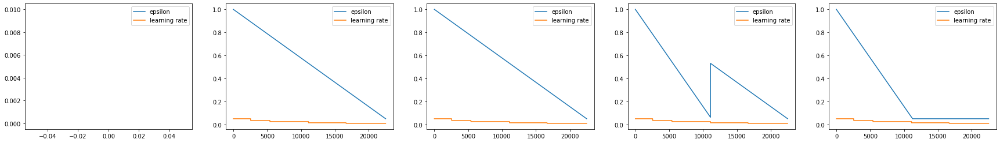

In [12]:
p, _ = vh.complete_plot_epsilon(alldfs, fig_width)
p.show()

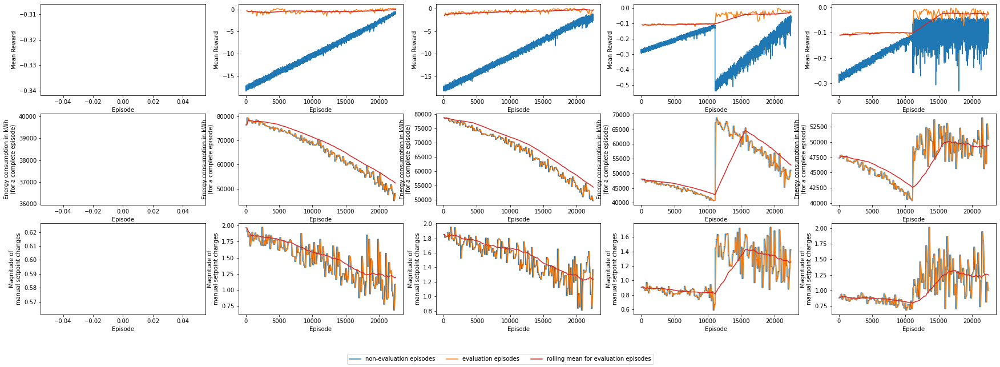

In [13]:
p, _ = vh.complete_plot_reward_stpc_econs(alldfs, fig_width)
p.show()

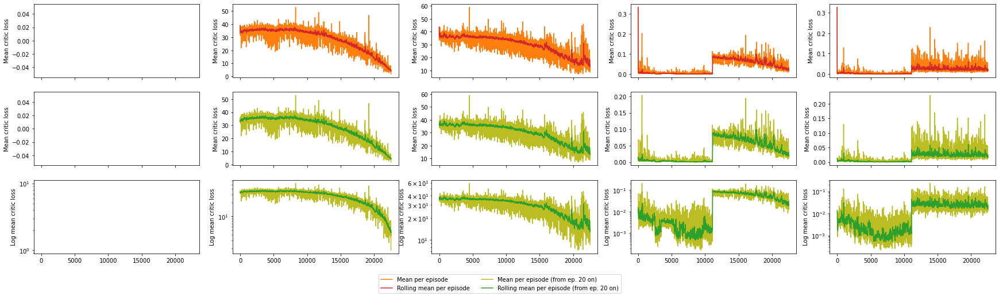

In [14]:
p, _ = vh.complete_plot_losses(alldfs, fig_width, with_agents=False)
p.show()

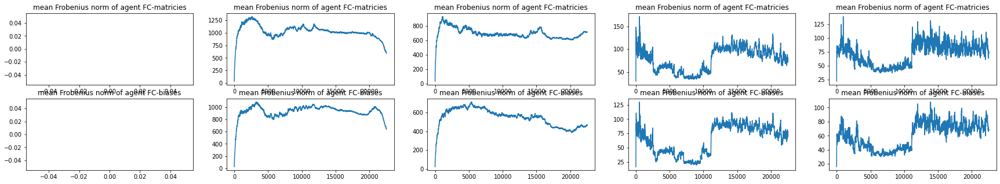

In [15]:
p, _ = vh.complete_plot_frobenius_norms(alldfs, fig_width, with_critics=False)
p.show()

In [16]:
last_available_eval_episodes = vh.compute_last_available_eval_episode(alldfs)

Last available evaluation episode for dfs0:      0
Last available evaluation episode for dfs1:  22499
Last available evaluation episode for dfs2:  22499
Last available evaluation episode for dfs3:  22499
Last available evaluation episode for dfs4:  22499


<h3>Details for one week</h3>

In [17]:
#selected_episodes = [13120 - 1, 14480 - 1, 14480 - 1]
#selected_weeks    = [datetime.datetime(2017, 1, 1), datetime.datetime(2017, 1, 1), datetime.datetime(2017, 1, 1)]

In [18]:
if not "selected_episodes" in locals().keys():
    selected_episodes = last_available_eval_episodes.copy()
if not "selected_weeks" in locals().keys():
    # the start of the evaluation episode
    selected_weeks = [datetime.datetime.strptime(dfs['sees'].iloc[0]["datetime"], "%Y-%m-%d %H:%M:%S")
                      for dfs in alldfs]

subdfs = vh.select_week_and_episode_for_dfs_list(alldfs, selected_episodes, selected_weeks)

In [19]:
vh.print_reward_informations(subdfs, selected_episodes)

First complete week of evaluation episode
For episode     0: Energy consumption:   38042.14 kWh; Sum of setpoint change magnitudes: 426.88118883889297
For episode 22499: Energy consumption:   48085.20 kWh; Sum of setpoint change magnitudes: 781.9786606105661
For episode 22499: Energy consumption:   49582.73 kWh; Sum of setpoint change magnitudes: 982.5547042875198
For episode 22499: Energy consumption:   51065.90 kWh; Sum of setpoint change magnitudes: 1024.815495064157
For episode 22499: Energy consumption:   50487.22 kWh; Sum of setpoint change magnitudes: 722.2174400117713

Mean values for episode ...
...     0: Reward: -0.32392 kWh; Setpoint change magnit.:  0.59372; Energy cons.: 52909.78911
... 22499: Reward:  0.27775 kWh; Setpoint change magnit.:  1.08759; Energy cons.: 66877.89227
... 22499: Reward: -0.21321 kWh; Setpoint change magnit.:  1.36656; Energy cons.: 68960.67462
... 22499: Reward: -0.02566 kWh; Setpoint change magnit.:  1.42533; Energy cons.: 71023.50701
... 22499: R

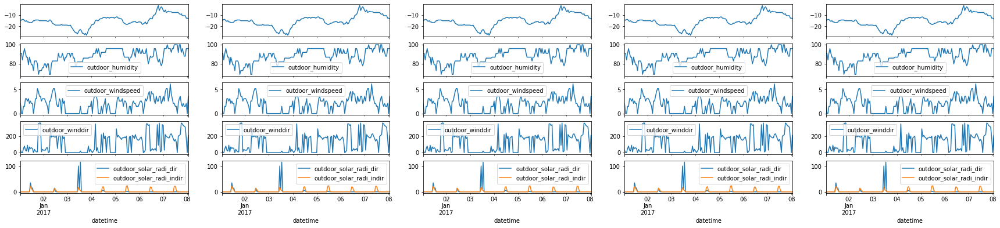

In [20]:
p, _ = vh.complete_plot_weather_information(subdfs, fig_width)
p.show()

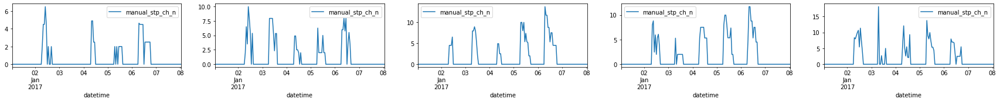

In [21]:
p, _ = vh.complete_plot_number_of_stp_ch(subdfs, fig_width)
p.show()

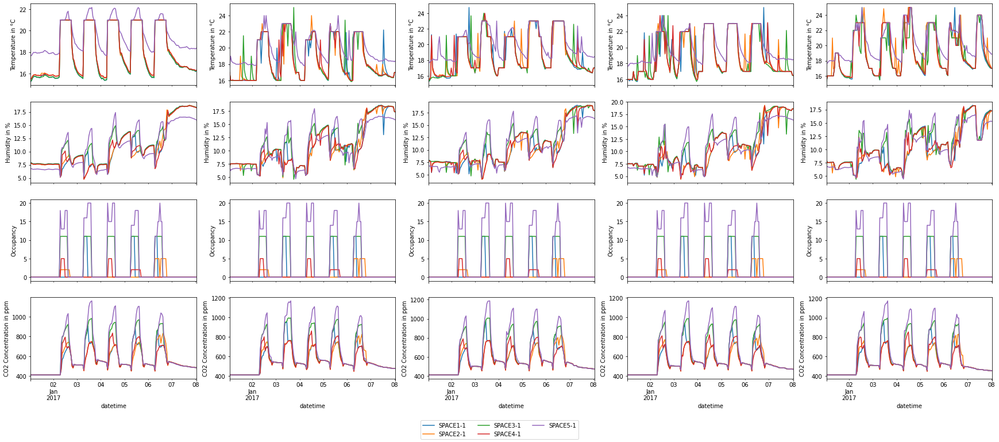

In [22]:
p, _ = vh.complete_plot_room_status(subdfs, fig_width)
p.show()

In [23]:
subdfs_rooms, subdfs_agents = vh.get_available_rooms_and_agents(subdfs)

Available Rooms     in (sub-)dfs0: ['SPACE1-1' 'SPACE2-1' 'SPACE3-1' 'SPACE4-1' 'SPACE5-1']
Available Agent IDs in (sub-)dfs0: {'SPACE1-1': 0, 'SPACE2-1': 1, 'SPACE3-1': 2, 'SPACE4-1': 3, 'SPACE5-1': 4} 

Available Rooms     in (sub-)dfs1: ['SPACE1-1' 'SPACE2-1' 'SPACE3-1' 'SPACE4-1' 'SPACE5-1']
Available Agent IDs in (sub-)dfs1: {'SPACE1-1': 0, 'SPACE2-1': 1, 'SPACE3-1': 2, 'SPACE4-1': 3, 'SPACE5-1': 4} 

Available Rooms     in (sub-)dfs2: ['SPACE1-1' 'SPACE2-1' 'SPACE3-1' 'SPACE4-1' 'SPACE5-1']
Available Agent IDs in (sub-)dfs2: {'SPACE1-1': 0, 'SPACE2-1': 1, 'SPACE3-1': 2, 'SPACE4-1': 3, 'SPACE5-1': 4} 

Available Rooms     in (sub-)dfs3: ['SPACE1-1' 'SPACE2-1' 'SPACE3-1' 'SPACE4-1' 'SPACE5-1']
Available Agent IDs in (sub-)dfs3: {'SPACE1-1': 0, 'SPACE2-1': 1, 'SPACE3-1': 2, 'SPACE4-1': 3, 'SPACE5-1': 4} 

Available Rooms     in (sub-)dfs4: ['SPACE1-1' 'SPACE2-1' 'SPACE3-1' 'SPACE4-1' 'SPACE5-1']
Available Agent IDs in (sub-)dfs4: {'SPACE1-1': 0, 'SPACE2-1': 1, 'SPACE3-1': 2, 'SPACE4

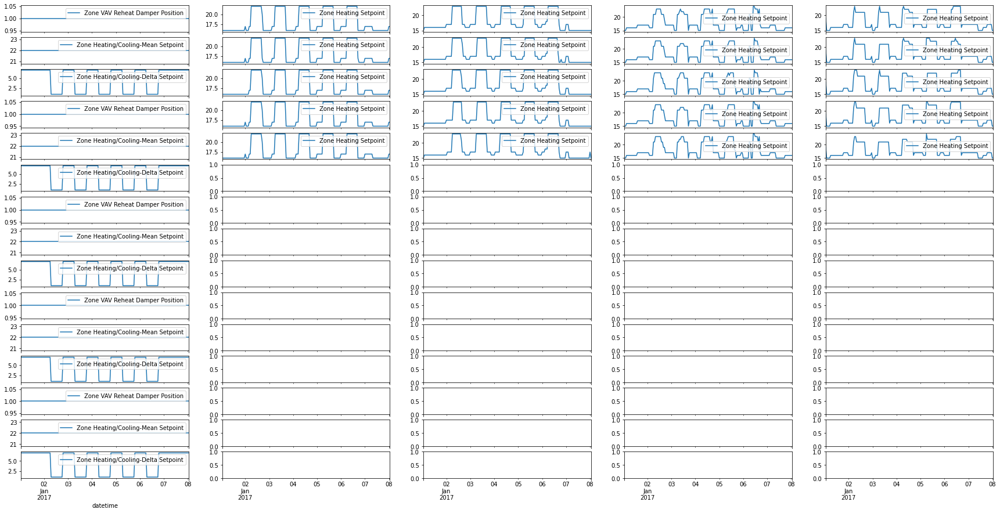

In [24]:
p, _ = vh.complete_plot_all_agent_outputs(subdfs, fig_width, subdfs_agents)
p.show()

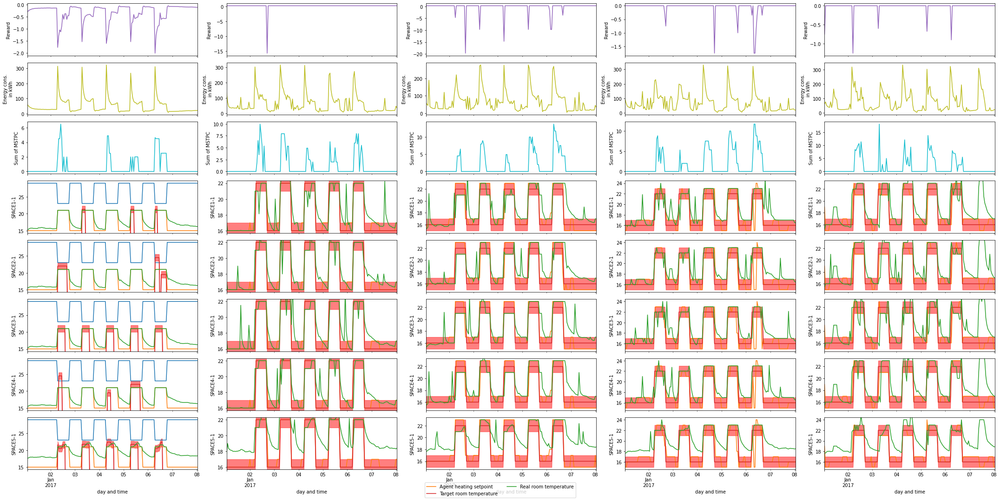

In [25]:
p, _ = vh.complete_plot_total_overview(subdfs, fig_width, subdfs_rooms, subdfs_agents)
p.show()

<h3>Details for a day</h3>

In [26]:
#selected_periods1    = [datetime.datetime(2017, 1, 3),
#                        datetime.datetime(2017, 1, 3),
#                        datetime.datetime(2017, 1, 3)]
#selected_periods1_end= [datetime.datetime(2017, 1, 4),
#                        datetime.datetime(2017, 1, 4),
#                        datetime.datetime(2017, 1, 4)]

In [27]:
if not "selected_periods1" in locals().keys():
    selected_periods1     = [datetime.datetime(2017, 1, 3) for _ in range(len(alldfs))]
if not "selected_periods1_end" in locals().keys():
    selected_periods1_end = [datetime.datetime(2017, 1, 4) for _ in range(len(alldfs))]

subdfs = vh.select_week_and_episode_with_end_for_dfs_list(
            alldfs,
            selected_episodes,
            selected_periods1,
            selected_periods1_end)

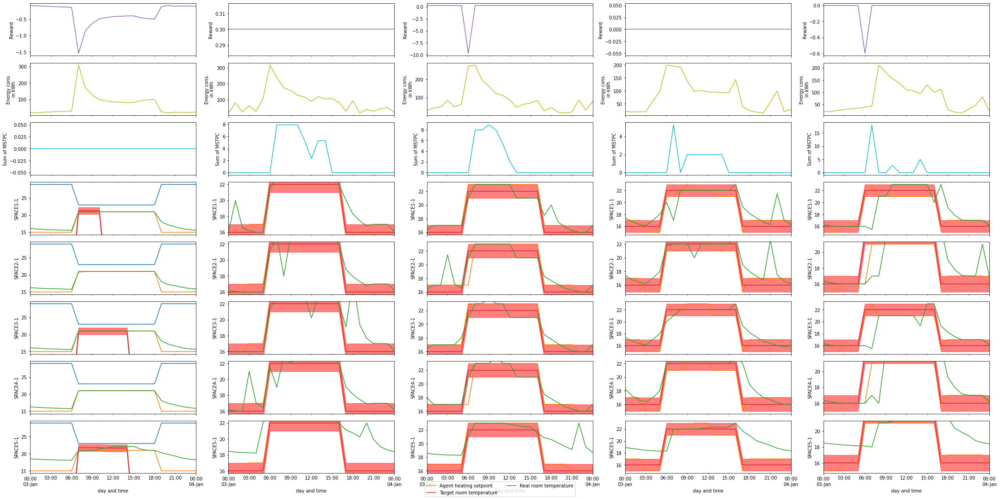

In [28]:
p, _ = vh.complete_plot_total_overview(subdfs, fig_width, subdfs_rooms, subdfs_agents)
p.show()

<h3>Details for a complete month</h3>

In [29]:
#selected_periods2    = [datetime.datetime(2017, 1, 1),
#                        datetime.datetime(2017, 1, 1),
#                        datetime.datetime(2017, 1, 1)]

In [30]:
if not "selected_periods2" in locals().keys():
    selected_periods2     = [datetime.datetime(2017, 1, 1) for _ in range(len(alldfs))]
selected_periods2_end = [datetime.datetime(2017, 1, 30) for _ in range(len(alldfs))]

subdfs = vh.select_week_and_episode_with_end_for_dfs_list(
            alldfs,
            selected_episodes,
            selected_periods2,
            selected_periods2_end)

For plot number 1, mean energy consumption =  52002.0 Wh, mean reward = -0.3174
For plot number 2, mean energy consumption =  66123.4 Wh, mean reward =  0.2770
For plot number 3, mean energy consumption =  68445.5 Wh, mean reward = -0.1411
For plot number 4, mean energy consumption =  70432.6 Wh, mean reward = -0.0265
For plot number 5, mean energy consumption =  69395.0 Wh, mean reward = -0.0229


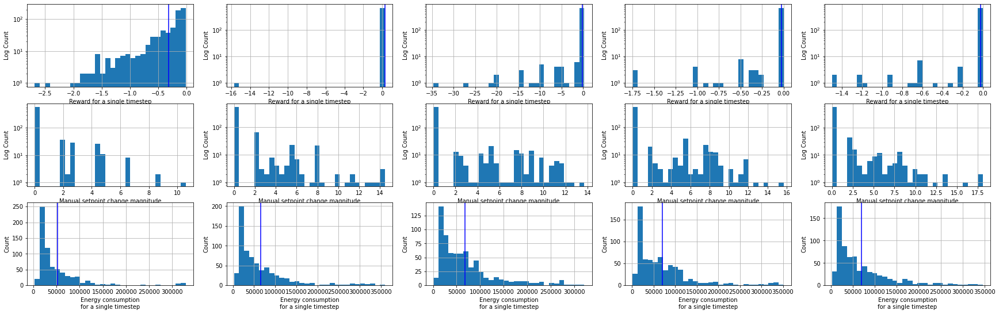

In [31]:
vh.plot_stpch_and_econs_distrib(subdfs, fig_width)

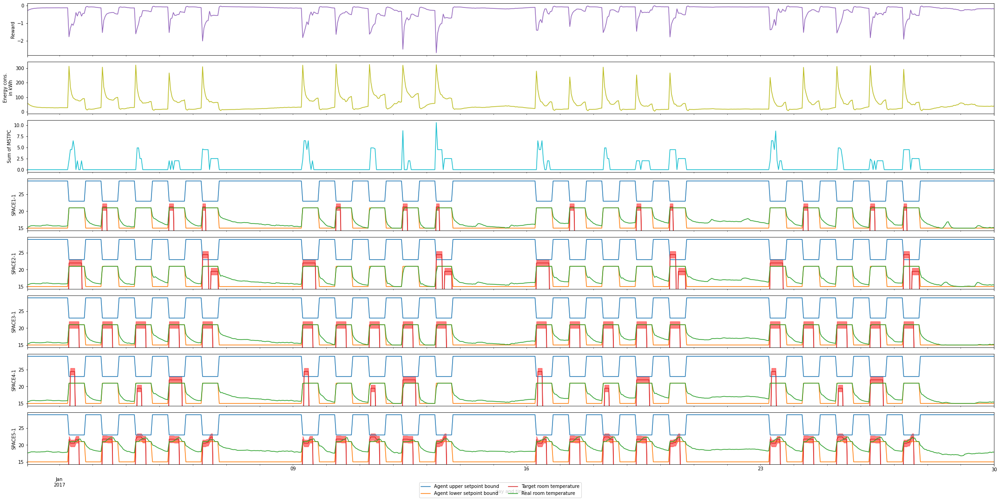

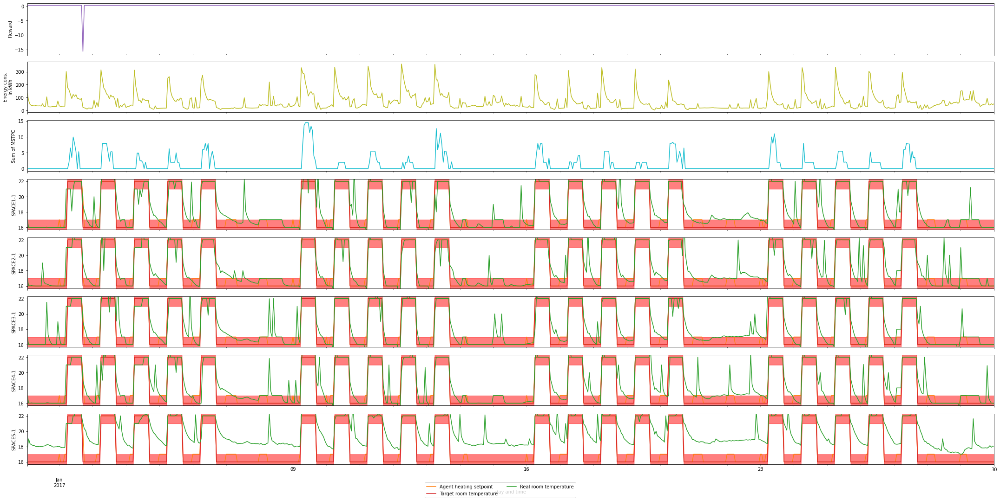

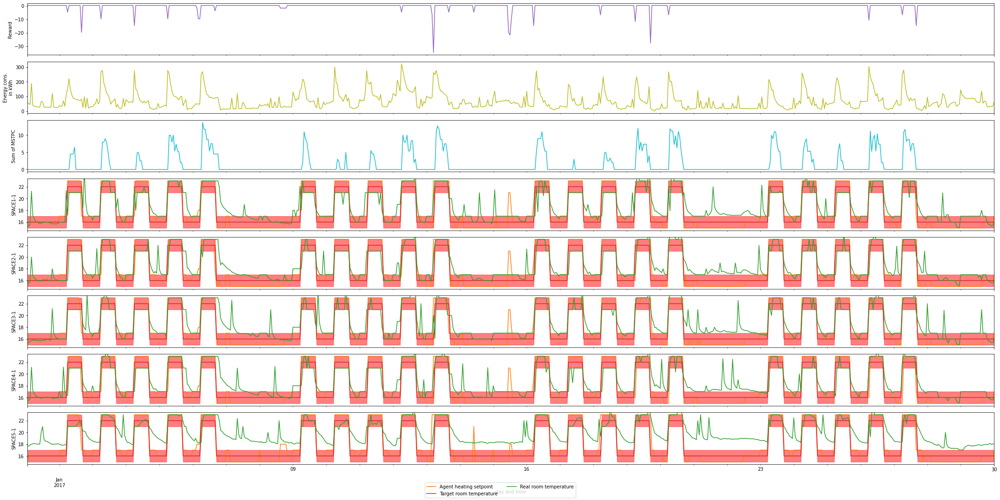

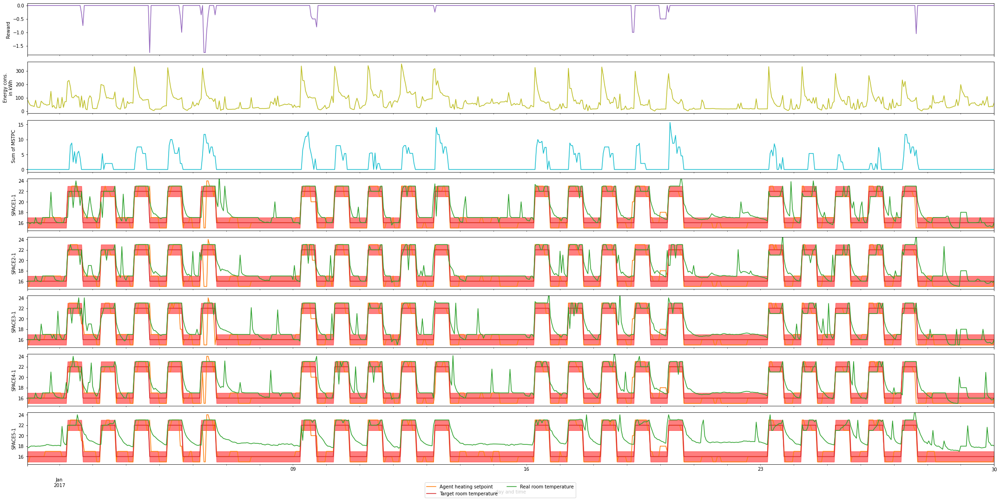

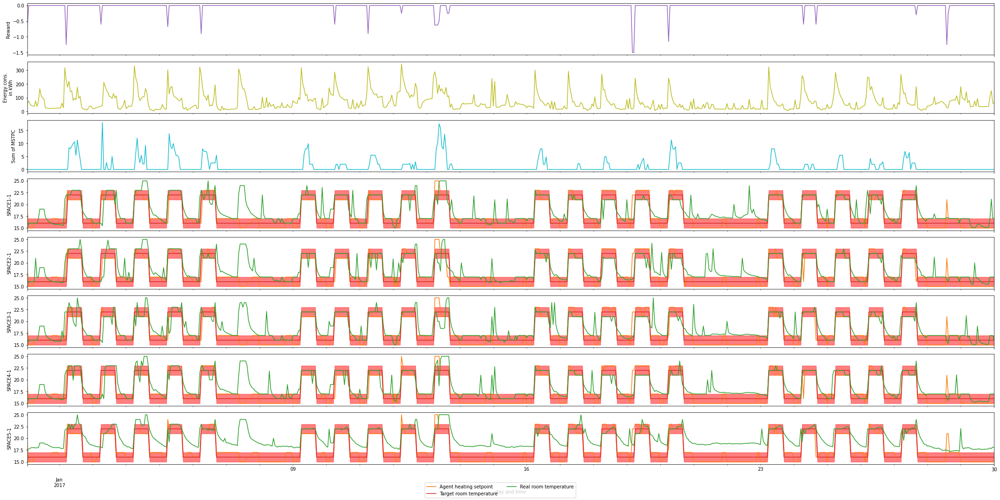

In [32]:
for idx, sdfs in enumerate(subdfs):
    p, _ = vh.complete_plot_total_overview(sdfs, fig_width,
                                           subdfs_rooms[idx],
                                           subdfs_agents[idx])
    p.show()

(<Figure size 2160x4320 with 40 Axes>,
 array([<AxesSubplot:ylabel='Scenario 1: s110\nAgent 0'>,
        <AxesSubplot:ylabel='Scenario 1: s110\nAgent 1'>,
        <AxesSubplot:ylabel='Scenario 1: s110\nAgent 2'>,
        <AxesSubplot:ylabel='Scenario 1: s110\nAgent 3'>,
        <AxesSubplot:ylabel='Scenario 1: s110\nAgent 4'>,
        <AxesSubplot:ylabel='Scenario 2: s110c\nAgent 0'>,
        <AxesSubplot:ylabel='Scenario 2: s110c\nAgent 1'>,
        <AxesSubplot:ylabel='Scenario 2: s110c\nAgent 2'>,
        <AxesSubplot:ylabel='Scenario 2: s110c\nAgent 3'>,
        <AxesSubplot:ylabel='Scenario 2: s110c\nAgent 4'>,
        <AxesSubplot:ylabel='Scenario 3: s110d\nAgent 0'>,
        <AxesSubplot:ylabel='Scenario 3: s110d\nAgent 1'>,
        <AxesSubplot:ylabel='Scenario 3: s110d\nAgent 2'>,
        <AxesSubplot:ylabel='Scenario 3: s110d\nAgent 3'>,
        <AxesSubplot:ylabel='Scenario 3: s110d\nAgent 4'>,
        <AxesSubplot:ylabel='Scenario 4: s110e\nAgent 0'>,
        <AxesSubplot:y

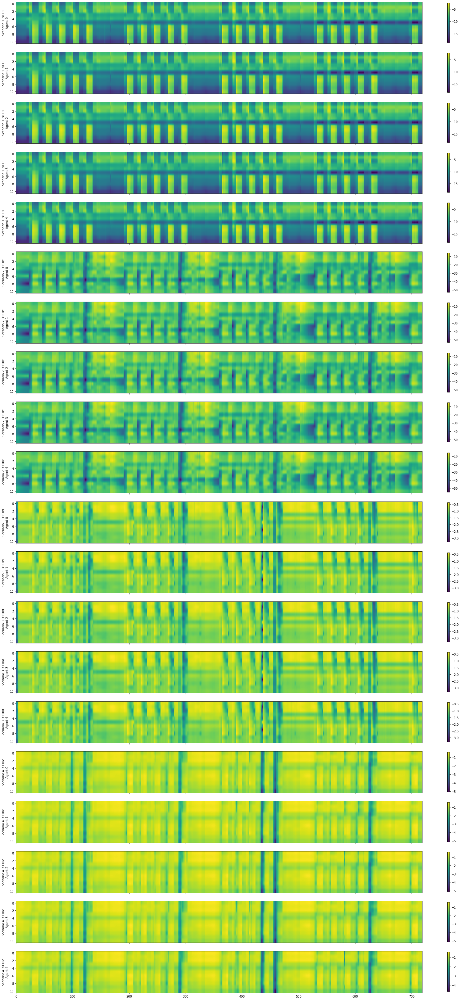

In [33]:
vh.plot_q_values(q_values, fig_width)